In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.graph_objects as go
from keras.models import Sequential
from keras.layers import Dense
from keras.layers import LSTM
from keras.layers import Dropout
from sklearn.preprocessing import MinMaxScaler
from keras import optimizers
from sklearn.metrics import mean_squared_error

In [2]:
def preparedata(file):
    cloud_cover = pd.read_csv(file, skipinitialspace = True)
    cloud_cover['Date'] = cloud_cover[['Year', 'Month', 'Day']].apply(lambda x: "{0}-{1}-{2}".format(str(x[0]).zfill(2), str(x[1]).zfill(2), str(x[2]).zfill(2)), axis=1) 
    cloud_cover['Time'] = cloud_cover[['Hour', 'Minute']].apply(lambda x: "{}:{}".format(str(x[0]).zfill(2), str(x[1]).zfill(2)), axis=1)
    cloud_cover.drop(["Year", "Month", "Day", "Hour", "Minute", "Second"], axis=1, inplace=True)  
    cloud_cover = cloud_cover.rename(columns={"CloudCover":"cloud_cover"})
    cloud_cover = cloud_cover.groupby(['Date', 'Time']).agg(cloud_cover=('cloud_cover','mean')).reset_index()
    cloud_cover['DateTime'] = cloud_cover[['Date', 'Time']].apply(lambda x: "{} {}".format(str(x[0]).zfill(2), str(x[1]).zfill(2)), axis=1)
    cloud_cover.drop(["Date", "Time"], axis=1, inplace=True)        
    cloud_cover['DateTime'] = pd.to_datetime(cloud_cover['DateTime'], format="%Y-%m-%d %H:%M")
    cloud_cover.dropna(inplace=True)
    return cloud_cover

In [3]:
def lags_train_test(data, lags):
	X, y = [], []
	for i in range(lags, len(data)):
		X.append(data[i-lags:i])
		y.append(data[i])
	return np.array(X), np.array(y)

In [4]:
def Xtrain_ytrain(train,test,lags):
    #scale train
    sc = MinMaxScaler()
    sc.fit(train)
    train_set_scale = sc.transform(train)
    # train
    X_train, y_train = lags_train_test(train_set_scale, lags)
    X_train = np.reshape(X_train, (X_train.shape[0], X_train.shape[1], 1))
    print("X_train Shape :", X_train.shape)
    print("y_train Shape :", y_train.shape)

    #scale test
    dataset_total = pd.concat((train['cloud_cover'], test['cloud_cover']), axis=0)
    inputs = dataset_total[len(dataset_total) - len(test) - lags:].values
    inputs = inputs.reshape(-1,1)
    inputs = sc.transform(inputs)
    # test
    X_test, y_test = lags_train_test(inputs, lags)
    print("X_test Shape : ", X_test.shape)
    print("y_test Shape : ", y_test.shape)
    return X_train, y_train, X_test, y_test, sc

In [5]:
def plot_curve(history):
    print('Last train loss: %s'%history.history['loss'][-1])
    print('Last validation loss: %s'%history.history['val_loss'][-1])
    
    # loss curves
    plt.figure(figsize=[8,6])

    loss = history.history['loss']
    val_loss = history.history['val_loss']
    
    epochs = range(1, len(loss) + 1)

    # Plot loss
    plt.plot(epochs, loss, 'c--', label='Training loss')
    plt.plot(epochs, val_loss, 'b', label='Validation loss')
    plt.title('Training and validation loss')
    plt.xlabel('Epochs')
    plt.ylabel('Loss')
    plt.legend()

In [6]:
def compare_mse_model(model,model_1):
    mse_error = [model,model_1]
    error = pd.DataFrame({"Model" : ['model','model_1'], "MSE error": mse_error})
    if model < model_1:
        model = model
        print("Better MSE value is : " , model)
    else:
        model_1 = model_1
        print("Better MSE value is : ", model_1)
    return error

In [7]:
cloud_cover = preparedata('../succeed-prophet/Bangkhuntean_CloudCover_2021-16Nov-16Dec.csv')
cloud_cover

,cloud_cover,DateTime
0,0.990000,2021-11-16 11:15:00
1,0.989000,2021-11-16 11:16:00
2,0.987667,2021-11-16 11:17:00
3,0.987000,2021-11-16 11:18:00
4,0.987000,2021-11-16 11:19:00
...,...,...
15056,0.168000,2021-12-16 13:58:00
15057,0.169000,2021-12-16 13:59:00
15058,0.147000,2021-12-16 14:00:00
15059,0.145000,2021-12-16 14:01:00


# Train/Test Model ,lags = 25

In [8]:
train = cloud_cover[cloud_cover['DateTime'] < '2021-12-16 00:00:00']
test = cloud_cover[cloud_cover['DateTime'] >= '2021-12-16 00:00:00']

train = train.set_index('DateTime')
test = test.set_index('DateTime')

X_train, y_train, X_test, y_test, sc = Xtrain_ytrain(train,test,25)

X_train Shape : (14743, 25, 1)
y_train Shape : (14743, 1)
X_test Shape :  (293, 25, 1)
y_test Shape :  (293, 1)


c:\Users\USER\AppData\Local\Programs\Python\Python310\lib\site-packages\sklearn\base.py:450: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(


In [9]:
train.reset_index(inplace=True)
test.reset_index(inplace=True)

## Optimizer adam

### Add frist layer: units = 50

In [10]:
test1 = test.copy()

In [11]:
model_50_adam = Sequential()
model_50_adam.add(LSTM(units = 50, return_sequences = False, input_shape = (X_train.shape[1], 1)))
model_50_adam.add(Dense(units = 1))
model_50_adam.compile(optimizer = 'adam', loss = 'mean_squared_error')
hist_adam = model_50_adam.fit(X_train, y_train, validation_data=(X_test, y_test), epochs = 10, batch_size = 32)

Epoch 1/10
461/461 [==============================] - 10s 14ms/step - loss: 0.0059 - accuracy: 0.0087 - val_loss: 0.0047 - val_accuracy: 0.0000e+00
Epoch 2/10
461/461 [==============================] - 5s 12ms/step - loss: 0.0022 - accuracy: 0.0088 - val_loss: 0.0035 - val_accuracy: 0.0000e+00
Epoch 3/10
461/461 [==============================] - 5s 10ms/step - loss: 0.0018 - accuracy: 0.0088 - val_loss: 0.0028 - val_accuracy: 0.0000e+00
Epoch 4/10
461/461 [==============================] - 5s 10ms/step - loss: 0.0016 - accuracy: 0.0088 - val_loss: 0.0025 - val_accuracy: 0.0000e+00
Epoch 5/10
461/461 [==============================] - 5s 10ms/step - loss: 0.0014 - accuracy: 0.0088 - val_loss: 0.0022 - val_accuracy: 0.0000e+00
Epoch 6/10
461/461 [==============================] - 5s 10ms/step - loss: 0.0013 - accuracy: 0.0088 - val_loss: 0.0020 - val_accuracy: 0.0000e+00
Epoch 7/10
461/461 [==============================] - 5s 10ms/step - loss: 0.0012 - accuracy: 0.0088 - val_loss: 0.00

Last train loss: 0.001171219744719565
Last validation loss: 0.0018160756444558501
Last train accuracy: 0.008817744441330433
Last validation accuracy: 0.0


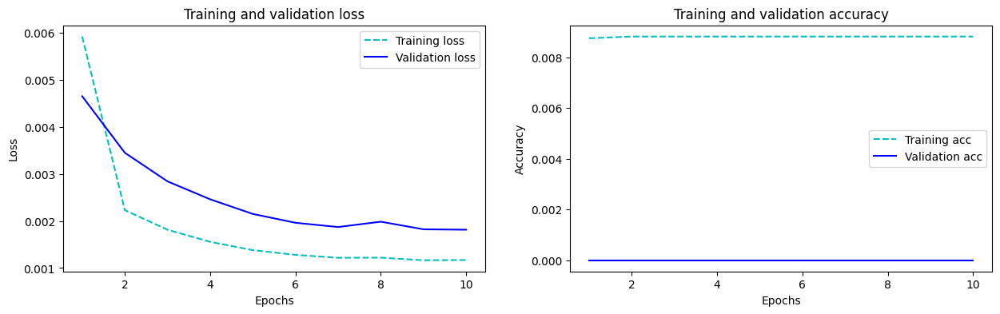

In [12]:
plot_curve(hist_adam)

In [13]:
predict_scaled_adam = model_50_adam.predict(X_test)
predict_adam = sc.inverse_transform(predict_scaled_adam)
test1['LSTM_adam'] = predict_adam
test1

10/10 [==============================] - 1s 5ms/step


,DateTime,cloud_cover,LSTM_adam
0,2021-12-16 09:10:00,0.111,0.329260
1,2021-12-16 09:11:00,0.112,0.138407
2,2021-12-16 09:12:00,0.116,0.118448
3,2021-12-16 09:13:00,0.112,0.121430
4,2021-12-16 09:14:00,0.099,0.119120
...,...,...,...
288,2021-12-16 13:58:00,0.168,0.172394
289,2021-12-16 13:59:00,0.169,0.172153
290,2021-12-16 14:00:00,0.147,0.172986
291,2021-12-16 14:01:00,0.145,0.154390


In [14]:
fig = go.Figure()
fig.add_trace(go.Scatter(mode = 'lines', x = cloud_cover['DateTime'], y = cloud_cover['cloud_cover'], name = 'Actual'))
fig.add_trace(go.Scatter(mode = 'lines', x = test1['DateTime'], y = test1['cloud_cover'], name = 'Actual Test'))
fig.add_trace(go.Scatter(mode = 'lines', x = test1['DateTime'], y = test1['LSTM_adam'], name = 'predict'))
fig.update_layout(
    autosize=True,
    height=600,
    title="LSTM Model",
    xaxis_title="Date",
    yaxis_title="Cloud cover",
)


fig.update_layout(
    xaxis=dict(
        rangeselector=dict(
            buttons=list([
                dict(count=1,
                     label="1.zoom",
                     step="hour",
                     stepmode="backward"),
                 dict(count=2,
                     label="2.zoom",
                     step="hour",
                     stepmode="backward"),
                dict(count=3,
                     label="3.zoom",
                     step="day",
                     stepmode="backward"),              

                dict(step="all")
            ])
        ),
        rangeslider=dict(
            visible=True
        ),
        type="date"
    )
)

fig.show()

In [15]:
lstm_mse_error_unit_50_adam = mean_squared_error(test1['cloud_cover'], test1['LSTM_adam'], squared=True)
lstm_mse_error_unit_50_adam

0.001807006382687474

In [26]:
mse_data = pd.DataFrame(columns=['Model' ,'LSTM lag25'])
mse_data.loc[len(mse_data)] = ['Lstm mse error unit 50 adam', lstm_mse_error_unit_50_adam]
mse_data

,Model,LSTM lag25
0,Lstm mse error unit 50 adam,0.001807


----------------------------------------------------------------------------------

## optimizer sgd

### Add frist layer: units = 50

In [16]:
model_50_sgd = Sequential()
model_50_sgd.add(LSTM(units = 50, return_sequences = False, input_shape = (X_train.shape[1], 1)))
model_50_sgd.add(Dense(units = 1))
model_50_sgd.compile(optimizer = 'sgd', loss = 'mean_squared_error')
hist_50_sgd = model_50_sgd.fit(X_train, y_train, validation_data=(X_test, y_test), epochs = 10, batch_size = 32)

Epoch 1/10
461/461 [==============================] - 8s 11ms/step - loss: 0.0205 - accuracy: 0.0085 - val_loss: 0.0062 - val_accuracy: 0.0000e+00
Epoch 2/10
461/461 [==============================] - 4s 10ms/step - loss: 0.0033 - accuracy: 0.0088 - val_loss: 0.0061 - val_accuracy: 0.0000e+00
Epoch 3/10
461/461 [==============================] - 4s 9ms/step - loss: 0.0032 - accuracy: 0.0088 - val_loss: 0.0059 - val_accuracy: 0.0000e+00
Epoch 4/10
461/461 [==============================] - 4s 9ms/step - loss: 0.0031 - accuracy: 0.0088 - val_loss: 0.0057 - val_accuracy: 0.0000e+00
Epoch 5/10
461/461 [==============================] - 4s 10ms/step - loss: 0.0030 - accuracy: 0.0088 - val_loss: 0.0055 - val_accuracy: 0.0000e+00
Epoch 6/10
461/461 [==============================] - 5s 10ms/step - loss: 0.0029 - accuracy: 0.0088 - val_loss: 0.0054 - val_accuracy: 0.0000e+00
Epoch 7/10
461/461 [==============================] - 5s 12ms/step - loss: 0.0028 - accuracy: 0.0088 - val_loss: 0.0053 

Last train loss: 0.0026648167986422777
Last validation loss: 0.004948076326400042
Last train accuracy: 0.008817744441330433
Last validation accuracy: 0.0


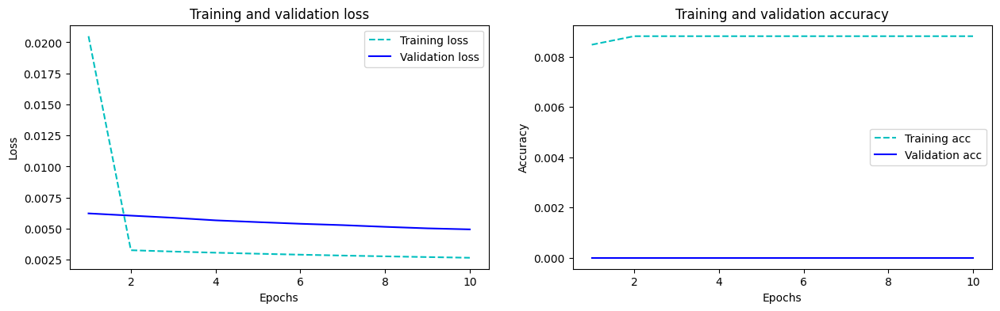

In [17]:
plot_curve(hist_50_sgd)

In [18]:
predict_scaled_50_sgd = model_50_sgd.predict(X_test)
predict_50_sgd = sc.inverse_transform(predict_scaled_50_sgd)
test1['LSTM_50_sgd'] = predict_50_sgd
test1

10/10 [==============================] - 1s 5ms/step


,DateTime,cloud_cover,LSTM_adam,LSTM_50_sgd
0,2021-12-16 09:10:00,0.111,0.329260,0.309875
1,2021-12-16 09:11:00,0.112,0.138407,0.268936
2,2021-12-16 09:12:00,0.116,0.118448,0.236563
3,2021-12-16 09:13:00,0.112,0.121430,0.211207
4,2021-12-16 09:14:00,0.099,0.119120,0.189869
...,...,...,...,...
288,2021-12-16 13:58:00,0.168,0.172394,0.173244
289,2021-12-16 13:59:00,0.169,0.172153,0.172402
290,2021-12-16 14:00:00,0.147,0.172986,0.171949
291,2021-12-16 14:01:00,0.145,0.154390,0.166888


In [19]:
fig = go.Figure()
fig.add_trace(go.Scatter(mode = 'lines', x = cloud_cover['DateTime'], y = cloud_cover['cloud_cover'], name = 'Actual'))
fig.add_trace(go.Scatter(mode = 'lines', x = test1['DateTime'], y = test1['cloud_cover'], name = 'Actual Test'))
fig.add_trace(go.Scatter(mode = 'lines', x = test1['DateTime'], y = test1['LSTM_50_sgd'], name = 'predict'))
fig.update_layout(
    autosize=True,
    height=600,
    title="LSTM Model",
    xaxis_title="Date",
    yaxis_title="Cloud cover",
)


fig.update_layout(
    xaxis=dict(
        rangeselector=dict(
            buttons=list([
                dict(count=1,
                     label="1.zoom",
                     step="hour",
                     stepmode="backward"),
                 dict(count=2,
                     label="2.zoom",
                     step="hour",
                     stepmode="backward"),
                dict(count=3,
                     label="3.zoom",
                     step="day",
                     stepmode="backward"),              

                dict(step="all")
            ])
        ),
        rangeslider=dict(
            visible=True
        ),
        type="date"
    )
)

fig.show()

In [20]:
lstm_mse_error_unit_50_sgd = mean_squared_error(test1['cloud_cover'], test1['LSTM_50_sgd'], squared=True)
compare_mse_model(lstm_mse_error_unit_50_adam,lstm_mse_error_unit_50_sgd)

Better MSE value is :  0.001807006382687474


,Model,MSE error
0,model,0.001807
1,model_1,0.004923


In [27]:
mse_data.loc[len(mse_data)] = ['Lstm mse error unit 50 sgd', lstm_mse_error_unit_50_sgd]

----------------------------------------------------------------------------------

## Optimizer RMSprop

### Add frist layer: units = 50

In [21]:
model_50_rms = Sequential()
model_50_rms.add(LSTM(units = 50, return_sequences = False, input_shape = (X_train.shape[1], 1)))
model_50_rms.add(Dense(units = 1))
model_50_rms.compile(optimizer = 'RMSprop', loss = 'mean_squared_error')
hist_50_rms = model_50_rms.fit(X_train, y_train, validation_data=(X_test, y_test), epochs = 10, batch_size = 32)

Epoch 1/10
461/461 [==============================] - 9s 13ms/step - loss: 0.0064 - accuracy: 0.0087 - val_loss: 0.0041 - val_accuracy: 0.0000e+00
Epoch 2/10
461/461 [==============================] - 5s 10ms/step - loss: 0.0018 - accuracy: 0.0088 - val_loss: 0.0023 - val_accuracy: 0.0000e+00
Epoch 3/10
461/461 [==============================] - 5s 10ms/step - loss: 0.0014 - accuracy: 0.0088 - val_loss: 0.0019 - val_accuracy: 0.0000e+00
Epoch 4/10
461/461 [==============================] - 5s 10ms/step - loss: 0.0013 - accuracy: 0.0088 - val_loss: 0.0018 - val_accuracy: 0.0000e+00
Epoch 5/10
461/461 [==============================] - 5s 10ms/step - loss: 0.0013 - accuracy: 0.0088 - val_loss: 0.0018 - val_accuracy: 0.0000e+00
Epoch 6/10
461/461 [==============================] - 5s 10ms/step - loss: 0.0012 - accuracy: 0.0088 - val_loss: 0.0019 - val_accuracy: 0.0000e+00
Epoch 7/10
461/461 [==============================] - 5s 10ms/step - loss: 0.0012 - accuracy: 0.0088 - val_loss: 0.001

Last train loss: 0.0012148451060056686
Last validation loss: 0.0018546127248555422
Last train accuracy: 0.008817744441330433
Last validation accuracy: 0.0


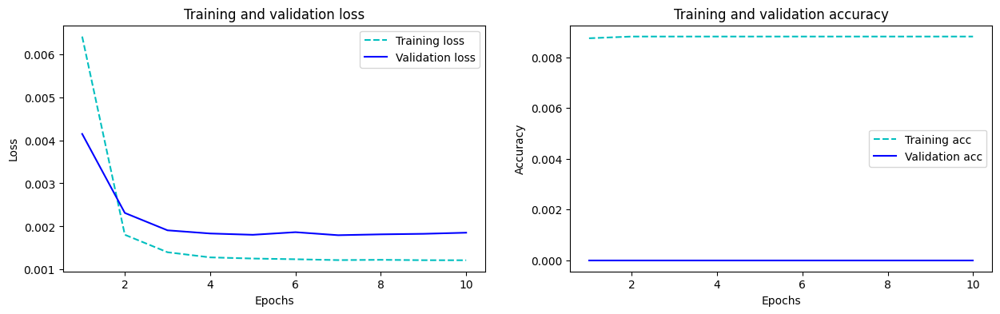

In [22]:
plot_curve(hist_50_rms)

In [23]:
predict_scaled_50_rms = model_50_rms.predict(X_test)
predict_50_rms = sc.inverse_transform(predict_scaled_50_rms)
test1['LSTM_50_rms'] = predict_50_rms
test1

10/10 [==============================] - 1s 4ms/step


,DateTime,cloud_cover,LSTM_adam,LSTM_50_sgd,LSTM_50_rms
0,2021-12-16 09:10:00,0.111,0.329260,0.309875,0.318412
1,2021-12-16 09:11:00,0.112,0.138407,0.268936,0.120718
2,2021-12-16 09:12:00,0.116,0.118448,0.236563,0.106233
3,2021-12-16 09:13:00,0.112,0.121430,0.211207,0.109812
4,2021-12-16 09:14:00,0.099,0.119120,0.189869,0.109572
...,...,...,...,...,...
288,2021-12-16 13:58:00,0.168,0.172394,0.173244,0.161581
289,2021-12-16 13:59:00,0.169,0.172153,0.172402,0.161394
290,2021-12-16 14:00:00,0.147,0.172986,0.171949,0.162241
291,2021-12-16 14:01:00,0.145,0.154390,0.166888,0.142502


In [24]:
fig = go.Figure()
fig.add_trace(go.Scatter(mode = 'lines', x = cloud_cover['DateTime'], y = cloud_cover['cloud_cover'], name = 'Actual'))
fig.add_trace(go.Scatter(mode = 'lines', x = test1['DateTime'], y = test1['cloud_cover'], name = 'Actual Test'))
fig.add_trace(go.Scatter(mode = 'lines', x = test1['DateTime'], y = test1['LSTM_50_rms'], name = 'predict'))
fig.update_layout(
    autosize=True,
    height=600,
    title="LSTM Model",
    xaxis_title="Date",
    yaxis_title="Cloud cover",
)


fig.update_layout(
    xaxis=dict(
        rangeselector=dict(
            buttons=list([
                dict(count=1,
                     label="1.zoom",
                     step="hour",
                     stepmode="backward"),
                 dict(count=2,
                     label="2.zoom",
                     step="hour",
                     stepmode="backward"),
                dict(count=3,
                     label="3.zoom",
                     step="day",
                     stepmode="backward"),              

                dict(step="all")
            ])
        ),
        rangeslider=dict(
            visible=True
        ),
        type="date"
    )
)

fig.show()

In [25]:
lstm_mse_error_unit_50_rms = mean_squared_error(test1['cloud_cover'], test1['LSTM_50_rms'], squared=True)
compare_mse_model(lstm_mse_error_unit_50_adam,lstm_mse_error_unit_50_rms)

Better MSE value is :  0.001807006382687474


,Model,MSE error
0,model,0.001807
1,model_1,0.001845


In [28]:
mse_data.loc[len(mse_data)] = ['Lstm mse error unit 50 rmsprop', lstm_mse_error_unit_50_rms]

In [29]:
mse_data

,Model,LSTM lag25
0,Lstm mse error unit 50 adam,0.001807
1,Lstm mse error unit 50 sgd,0.004923
2,Lstm mse error unit 50 rmsprop,0.001845


----------------------------------------------------------------------------------

## Optimizer adam

### Add frist layer: units = 50 and batch_size 64

In [30]:
model_batch_size64 = Sequential()
model_batch_size64.add(LSTM(units = 50, return_sequences = False, input_shape = (X_train.shape[1], 1)))
model_batch_size64.add(Dense(units = 1))
model_batch_size64.compile(optimizer = 'adam', loss = 'mean_squared_error')
hist_batch_size64 = model_batch_size64.fit(X_train, y_train, validation_data=(X_test, y_test),  epochs = 10, batch_size = 64)

Epoch 1/10
231/231 [==============================] - 7s 17ms/step - loss: 0.0105 - accuracy: 0.0085 - val_loss: 0.0061 - val_accuracy: 0.0000e+00
Epoch 2/10
231/231 [==============================] - 4s 16ms/step - loss: 0.0029 - accuracy: 0.0088 - val_loss: 0.0046 - val_accuracy: 0.0000e+00
Epoch 3/10
231/231 [==============================] - 3s 15ms/step - loss: 0.0023 - accuracy: 0.0088 - val_loss: 0.0038 - val_accuracy: 0.0000e+00
Epoch 4/10
231/231 [==============================] - 3s 14ms/step - loss: 0.0020 - accuracy: 0.0088 - val_loss: 0.0034 - val_accuracy: 0.0000e+00
Epoch 5/10
231/231 [==============================] - 3s 14ms/step - loss: 0.0018 - accuracy: 0.0088 - val_loss: 0.0029 - val_accuracy: 0.0000e+00
Epoch 6/10
231/231 [==============================] - 3s 13ms/step - loss: 0.0016 - accuracy: 0.0088 - val_loss: 0.0026 - val_accuracy: 0.0000e+00
Epoch 7/10
231/231 [==============================] - 3s 13ms/step - loss: 0.0015 - accuracy: 0.0088 - val_loss: 0.002

Last train loss: 0.0012533969711512327
Last validation loss: 0.0019741945434361696
Last train accuracy: 0.008817744441330433
Last validation accuracy: 0.0


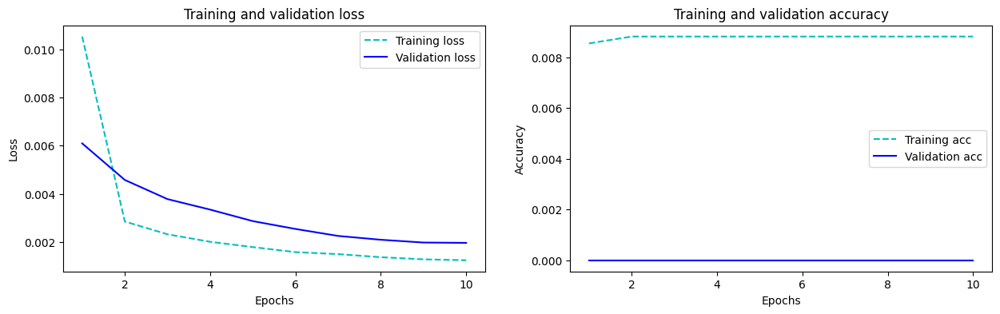

In [31]:
plot_curve(hist_batch_size64)

In [32]:
predict_scaled_batch_size64 = model_batch_size64.predict(X_test)
predict_batch_size64 = sc.inverse_transform(predict_scaled_batch_size64)
test1['LSTM_4_batch_size'] = predict_batch_size64
test1

10/10 [==============================] - 1s 4ms/step


,DateTime,cloud_cover,LSTM_adam,LSTM_50_sgd,LSTM_50_rms,LSTM_4_batch_size
0,2021-12-16 09:10:00,0.111,0.329260,0.309875,0.318412,0.332664
1,2021-12-16 09:11:00,0.112,0.138407,0.268936,0.120718,0.174398
2,2021-12-16 09:12:00,0.116,0.118448,0.236563,0.106233,0.126802
3,2021-12-16 09:13:00,0.112,0.121430,0.211207,0.109812,0.124075
4,2021-12-16 09:14:00,0.099,0.119120,0.189869,0.109572,0.123607
...,...,...,...,...,...,...
288,2021-12-16 13:58:00,0.168,0.172394,0.173244,0.161581,0.173642
289,2021-12-16 13:59:00,0.169,0.172153,0.172402,0.161394,0.173180
290,2021-12-16 14:00:00,0.147,0.172986,0.171949,0.162241,0.173732
291,2021-12-16 14:01:00,0.145,0.154390,0.166888,0.142502,0.158733


In [33]:
fig = go.Figure()
fig.add_trace(go.Scatter(mode = 'lines', x = cloud_cover['DateTime'], y = cloud_cover['cloud_cover'], name = 'Actual'))
fig.add_trace(go.Scatter(mode = 'lines', x = test1['DateTime'], y = test1['cloud_cover'], name = 'Actual Test'))
fig.add_trace(go.Scatter(mode = 'lines', x = test1['DateTime'], y = test1['LSTM_4_batch_size'], name = 'predict'))
fig.update_layout(
    autosize=True,
    height=600,
    title="LSTM Model",
    xaxis_title="Date",
    yaxis_title="Cloud cover",
)


fig.update_layout(
    xaxis=dict(
        rangeselector=dict(
            buttons=list([
                dict(count=1,
                     label="1.zoom",
                     step="hour",
                     stepmode="backward"),
                 dict(count=2,
                     label="2.zoom",
                     step="hour",
                     stepmode="backward"),
                dict(count=3,
                     label="3.zoom",
                     step="day",
                     stepmode="backward"),              

                dict(step="all")
            ])
        ),
        rangeslider=dict(
            visible=True
        ),
        type="date"
    )
)

fig.show()

In [34]:
lstm_mse_error_batch_size64 = mean_squared_error(test1['cloud_cover'], test1['LSTM_4_batch_size'], squared=True)
compare_mse_model(lstm_mse_error_unit_50_adam,lstm_mse_error_batch_size64)

Better MSE value is :  0.001807006382687474


,Model,MSE error
0,model,0.001807
1,model_1,0.001964


In [35]:
mse_data.loc[len(mse_data)] = ['Lstm mse error adam 50 batch_size64', lstm_mse_error_batch_size64]

---

### learning rate 0.1

In [36]:
test2 = test.copy()

#### Add frist layer: units = 50

In [42]:
model_01 = Sequential()
model_01.add(LSTM(units = 50, return_sequences = False, input_shape = (X_train.shape[1], 1)))
model_01.add(Dense(units = 1))
opt = optimizers.Adam(learning_rate=0.1)
model_01.compile(optimizer = opt, loss = 'mean_squared_error')
hist_01 = model_01.fit(X_train, y_train, validation_data=(X_test, y_test), epochs = 10, batch_size = 32)

Epoch 1/10
461/461 [==============================] - 9s 12ms/step - loss: 0.0773 - accuracy: 0.0085 - val_loss: 0.0019 - val_accuracy: 0.0000e+00
Epoch 2/10
461/461 [==============================] - 5s 11ms/step - loss: 0.0016 - accuracy: 0.0088 - val_loss: 0.0018 - val_accuracy: 0.0000e+00
Epoch 3/10
461/461 [==============================] - 5s 10ms/step - loss: 0.0018 - accuracy: 0.0088 - val_loss: 0.0019 - val_accuracy: 0.0000e+00
Epoch 4/10
461/461 [==============================] - 5s 11ms/step - loss: 0.0017 - accuracy: 0.0088 - val_loss: 0.0019 - val_accuracy: 0.0000e+00
Epoch 5/10
461/461 [==============================] - 6s 13ms/step - loss: 0.0015 - accuracy: 0.0088 - val_loss: 0.0020 - val_accuracy: 0.0000e+00
Epoch 6/10
461/461 [==============================] - 5s 10ms/step - loss: 0.0016 - accuracy: 0.0088 - val_loss: 0.0020 - val_accuracy: 0.0000e+00
Epoch 7/10
461/461 [==============================] - 5s 10ms/step - loss: 0.0015 - accuracy: 0.0088 - val_loss: 0.002

Last train loss: 0.0014755133306607604
Last validation loss: 0.0023322065826505423
Last train accuracy: 0.008817744441330433
Last validation accuracy: 0.0


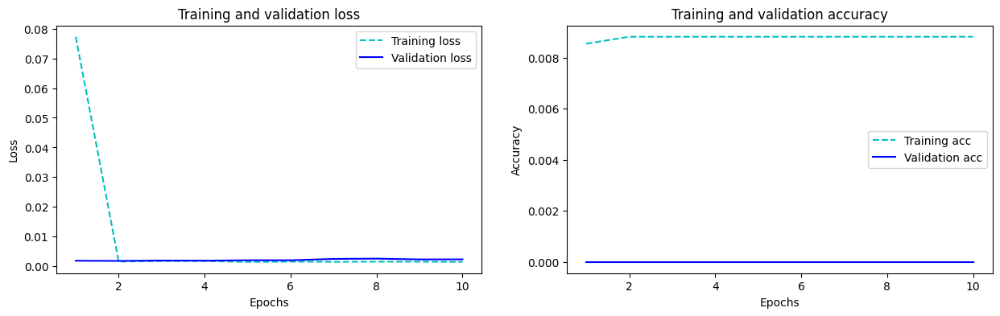

In [43]:
plot_curve(hist_01)

In [44]:
predict_scaled_01 = model_01.predict(X_test)
predict_01 = sc.inverse_transform(predict_scaled_01)
test2['LSTM_01'] = predict_01
test2

10/10 [==============================] - 1s 5ms/step


,DateTime,cloud_cover,LSTM_01
0,2021-12-16 09:10:00,0.111,0.350672
1,2021-12-16 09:11:00,0.112,0.149905
2,2021-12-16 09:12:00,0.116,0.132520
3,2021-12-16 09:13:00,0.112,0.137240
4,2021-12-16 09:14:00,0.099,0.137607
...,...,...,...
288,2021-12-16 13:58:00,0.168,0.188434
289,2021-12-16 13:59:00,0.169,0.188446
290,2021-12-16 14:00:00,0.147,0.189143
291,2021-12-16 14:01:00,0.145,0.169085


In [45]:
fig = go.Figure()
fig.add_trace(go.Scatter(mode = 'lines', x = cloud_cover['DateTime'], y = cloud_cover['cloud_cover'], name = 'Actual'))
fig.add_trace(go.Scatter(mode = 'lines', x = test2['DateTime'], y = test2['cloud_cover'], name = 'Actual Test'))
fig.add_trace(go.Scatter(mode = 'lines', x = test2['DateTime'], y = test2['LSTM_01'], name = 'predict'))
fig.update_layout(
    autosize=True,
    height=600,
    title="LSTM Model",
    xaxis_title="Date",
    yaxis_title="Cloud cover",
)


fig.update_layout(
    xaxis=dict(
        rangeselector=dict(
            buttons=list([
                dict(count=1,
                     label="1.zoom",
                     step="hour",
                     stepmode="backward"),
                 dict(count=2,
                     label="2.zoom",
                     step="hour",
                     stepmode="backward"),
                dict(count=3,
                     label="3.zoom",
                     step="day",
                     stepmode="backward"),              

                dict(step="all")
            ])
        ),
        rangeslider=dict(
            visible=True
        ),
        type="date"
    )
)

fig.show()

In [46]:
lstm_mse_error_unit_50_01 = mean_squared_error(test2['cloud_cover'], test2['LSTM_01'], squared=True)
compare_mse_model(lstm_mse_error_unit_50_adam,lstm_mse_error_unit_50_01)

Better MSE value is :  0.001807006382687474


,Model,MSE error
0,model,0.001807
1,model_1,0.002321


In [47]:
mse_data.loc[len(mse_data)] = ['Lstm mse error adam 50 learning rate 0.1', lstm_mse_error_unit_50_01]
mse_data

,Model,LSTM lag25
0,Lstm mse error unit 50 adam,0.001807
1,Lstm mse error unit 50 sgd,0.004923
2,Lstm mse error unit 50 rmsprop,0.001845
3,Lstm mse error adam 50 batch_size64,0.001964
4,Lstm mse error adam 50 learning rate 0.1,0.002321


----------------------------------------------------------------------------------

### lr 0.05

#### Add frist layer: units = 50

In [48]:
model_005 = Sequential()
model_005.add(LSTM(units = 50, return_sequences = False, input_shape = (X_train.shape[1], 1)))
model_005.add(Dense(units = 1))
opt = optimizers.Adam(learning_rate=0.05)
model_005.compile(optimizer = opt, loss = 'mean_squared_error')
hist_005 = model_005.fit(X_train, y_train, validation_data=(X_test, y_test), epochs = 10, batch_size = 32)

Epoch 1/10
461/461 [==============================] - 10s 14ms/step - loss: 0.0731 - accuracy: 0.0078 - val_loss: 0.0028 - val_accuracy: 0.0000e+00
Epoch 2/10
461/461 [==============================] - 6s 12ms/step - loss: 0.0027 - accuracy: 0.0088 - val_loss: 0.0020 - val_accuracy: 0.0000e+00
Epoch 3/10
461/461 [==============================] - 5s 12ms/step - loss: 0.0030 - accuracy: 0.0088 - val_loss: 0.0062 - val_accuracy: 0.0000e+00
Epoch 4/10
461/461 [==============================] - 5s 10ms/step - loss: 0.0031 - accuracy: 0.0088 - val_loss: 0.0021 - val_accuracy: 0.0000e+00
Epoch 5/10
461/461 [==============================] - 5s 11ms/step - loss: 0.0037 - accuracy: 0.0088 - val_loss: 0.0022 - val_accuracy: 0.0000e+00
Epoch 6/10
461/461 [==============================] - 5s 10ms/step - loss: 0.0036 - accuracy: 0.0088 - val_loss: 0.0023 - val_accuracy: 0.0000e+00
Epoch 7/10
461/461 [==============================] - 5s 10ms/step - loss: 0.0036 - accuracy: 0.0088 - val_loss: 0.00

Last train loss: 0.002033061347901821
Last validation loss: 0.0019638151861727238
Last train accuracy: 0.008817744441330433
Last validation accuracy: 0.0


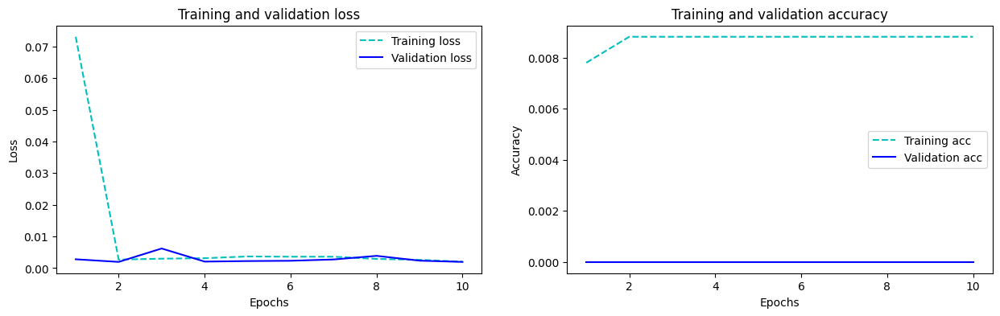

In [49]:
plot_curve(hist_005)

In [50]:
predict_scaled_005 = model_005.predict(X_test)
predict_005 = sc.inverse_transform(predict_scaled_005)
test2['LSTM_005'] = predict_005
test2

10/10 [==============================] - 1s 4ms/step


,DateTime,cloud_cover,LSTM_01,LSTM_005
0,2021-12-16 09:10:00,0.111,0.350672,0.299703
1,2021-12-16 09:11:00,0.112,0.149905,0.071950
2,2021-12-16 09:12:00,0.116,0.132520,0.115974
3,2021-12-16 09:13:00,0.112,0.137240,0.115293
4,2021-12-16 09:14:00,0.099,0.137607,0.110649
...,...,...,...,...
288,2021-12-16 13:58:00,0.168,0.188434,0.157471
289,2021-12-16 13:59:00,0.169,0.188446,0.157997
290,2021-12-16 14:00:00,0.147,0.189143,0.159008
291,2021-12-16 14:01:00,0.145,0.169085,0.135622


In [51]:
fig = go.Figure()
fig.add_trace(go.Scatter(mode = 'lines', x = cloud_cover['DateTime'], y = cloud_cover['cloud_cover'], name = 'Actual'))
fig.add_trace(go.Scatter(mode = 'lines', x = test2['DateTime'], y = test2['cloud_cover'], name = 'Actual Test'))
fig.add_trace(go.Scatter(mode = 'lines', x = test2['DateTime'], y = test2['LSTM_005'], name = 'predict'))
fig.update_layout(
    autosize=True,
    height=600,
    title="LSTM Model",
    xaxis_title="Date",
    yaxis_title="Cloud cover",
)


fig.update_layout(
    xaxis=dict(
        rangeselector=dict(
            buttons=list([
                dict(count=1,
                     label="1.zoom",
                     step="hour",
                     stepmode="backward"),
                 dict(count=2,
                     label="2.zoom",
                     step="hour",
                     stepmode="backward"),
                dict(count=3,
                     label="3.zoom",
                     step="day",
                     stepmode="backward"),              

                dict(step="all")
            ])
        ),
        rangeslider=dict(
            visible=True
        ),
        type="date"
    )
)

fig.show()

In [52]:
lstm_mse_error_unit_50_005 = mean_squared_error(test2['cloud_cover'], test2['LSTM_005'], squared=True)
compare_mse_model(lstm_mse_error_unit_50_adam,lstm_mse_error_unit_50_005)

Better MSE value is :  0.001807006382687474


,Model,MSE error
0,model,0.001807
1,model_1,0.001954


In [68]:
mse_data.loc[len(mse_data)] = ['Lstm mse error adam 50 learning rate 0.05', lstm_mse_error_unit_50_005]

----------------------------------------------------------------------------------

### lr 0.01

#### Add frist layer: units = 50

In [53]:
model_001 = Sequential()
model_001.add(LSTM(units = 50, return_sequences = False, input_shape = (X_train.shape[1], 1)))
model_001.add(Dense(units = 1))
opt = optimizers.Adam(learning_rate=0.01)
model_001.compile(optimizer = opt, loss = 'mean_squared_error')
hist_001 = model_001.fit(X_train, y_train, validation_data=(X_test, y_test), epochs = 10, batch_size = 32)

Epoch 1/10
461/461 [==============================] - 9s 11ms/step - loss: 0.0040 - accuracy: 0.0088 - val_loss: 0.0031 - val_accuracy: 0.0000e+00
Epoch 2/10
461/461 [==============================] - 4s 9ms/step - loss: 0.0014 - accuracy: 0.0088 - val_loss: 0.0019 - val_accuracy: 0.0000e+00
Epoch 3/10
461/461 [==============================] - 4s 9ms/step - loss: 0.0012 - accuracy: 0.0088 - val_loss: 0.0021 - val_accuracy: 0.0000e+00
Epoch 4/10
461/461 [==============================] - 4s 9ms/step - loss: 0.0013 - accuracy: 0.0088 - val_loss: 0.0018 - val_accuracy: 0.0000e+00
Epoch 5/10
461/461 [==============================] - 4s 9ms/step - loss: 0.0012 - accuracy: 0.0088 - val_loss: 0.0019 - val_accuracy: 0.0000e+00
Epoch 6/10
461/461 [==============================] - 4s 9ms/step - loss: 0.0012 - accuracy: 0.0088 - val_loss: 0.0021 - val_accuracy: 0.0000e+00
Epoch 7/10
461/461 [==============================] - 4s 9ms/step - loss: 0.0012 - accuracy: 0.0088 - val_loss: 0.0019 - va

Last train loss: 0.001230723108164966
Last validation loss: 0.0018959405133500695
Last train accuracy: 0.008817744441330433
Last validation accuracy: 0.0


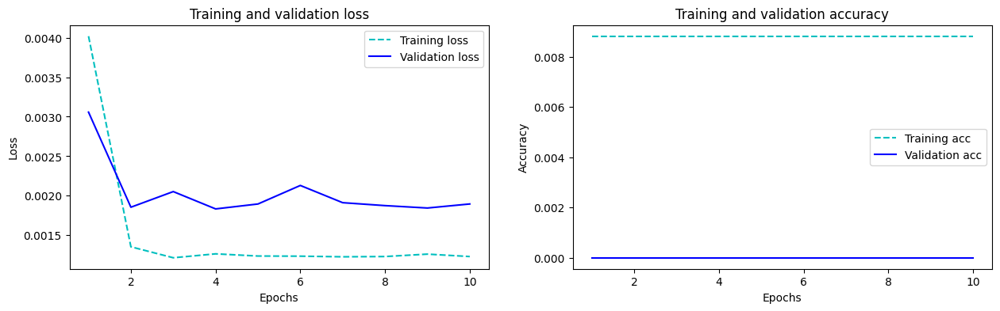

In [54]:
plot_curve(hist_001)

In [55]:
predict_scaled_001 = model_001.predict(X_test)
predict_001 = sc.inverse_transform(predict_scaled_001)
test2['LSTM_001'] = predict_001
test2

10/10 [==============================] - 1s 4ms/step


,DateTime,cloud_cover,LSTM_01,LSTM_005,LSTM_001
0,2021-12-16 09:10:00,0.111,0.350672,0.299703,0.329454
1,2021-12-16 09:11:00,0.112,0.149905,0.071950,0.113542
2,2021-12-16 09:12:00,0.116,0.132520,0.115974,0.093445
3,2021-12-16 09:13:00,0.112,0.137240,0.115293,0.105971
4,2021-12-16 09:14:00,0.099,0.137607,0.110649,0.107417
...,...,...,...,...,...
288,2021-12-16 13:58:00,0.168,0.188434,0.157471,0.163917
289,2021-12-16 13:59:00,0.169,0.188446,0.157997,0.163696
290,2021-12-16 14:00:00,0.147,0.189143,0.159008,0.164721
291,2021-12-16 14:01:00,0.145,0.169085,0.135622,0.143030


In [56]:
fig = go.Figure()
fig.add_trace(go.Scatter(mode = 'lines', x = cloud_cover['DateTime'], y = cloud_cover['cloud_cover'], name = 'Actual'))
fig.add_trace(go.Scatter(mode = 'lines', x = test2['DateTime'], y = test2['cloud_cover'], name = 'Actual Test'))
fig.add_trace(go.Scatter(mode = 'lines', x = test2['DateTime'], y = test2['LSTM_001'], name = 'predict'))
fig.update_layout(
    autosize=True,
    height=600,
    title="LSTM Model",
    xaxis_title="Date",
    yaxis_title="Cloud cover",
)


fig.update_layout(
    xaxis=dict(
        rangeselector=dict(
            buttons=list([
                dict(count=1,
                     label="1.zoom",
                     step="hour",
                     stepmode="backward"),
                 dict(count=2,
                     label="2.zoom",
                     step="hour",
                     stepmode="backward"),
                dict(count=3,
                     label="3.zoom",
                     step="day",
                     stepmode="backward"),              

                dict(step="all")
            ])
        ),
        rangeslider=dict(
            visible=True
        ),
        type="date"
    )
)

fig.show()

In [57]:
lstm_mse_error_001 = mean_squared_error(test2['cloud_cover'], test2['LSTM_001'], squared=True)
compare_mse_model(lstm_mse_error_unit_50_adam,lstm_mse_error_001)

Better MSE value is :  0.001807006382687474


,Model,MSE error
0,model,0.001807
1,model_1,0.001886


In [69]:
mse_data.loc[len(mse_data)] = ['Lstm mse error adam 50 learning rate 0.01', lstm_mse_error_001]

----------------------------------------------------------------------------------

### lr 0.005

#### Add frist layer: units = 50

In [58]:
model_0005 = Sequential()
model_0005.add(LSTM(units = 50, return_sequences = False, input_shape = (X_train.shape[1], 1)))
model_0005.add(Dense(units = 1))
opt = optimizers.Adam(learning_rate=0.005)
model_0005.compile(optimizer = opt, loss = 'mean_squared_error')
hist_0005 = model_0005.fit(X_train, y_train, validation_data=(X_test, y_test), epochs = 10, batch_size = 32)

Epoch 1/10
461/461 [==============================] - 8s 11ms/step - loss: 0.0055 - accuracy: 0.0088 - val_loss: 0.0034 - val_accuracy: 0.0000e+00
Epoch 2/10
461/461 [==============================] - 4s 9ms/step - loss: 0.0016 - accuracy: 0.0088 - val_loss: 0.0022 - val_accuracy: 0.0000e+00
Epoch 3/10
461/461 [==============================] - 4s 9ms/step - loss: 0.0013 - accuracy: 0.0088 - val_loss: 0.0019 - val_accuracy: 0.0000e+00
Epoch 4/10
461/461 [==============================] - 4s 9ms/step - loss: 0.0012 - accuracy: 0.0088 - val_loss: 0.0019 - val_accuracy: 0.0000e+00
Epoch 5/10
461/461 [==============================] - 4s 9ms/step - loss: 0.0012 - accuracy: 0.0088 - val_loss: 0.0019 - val_accuracy: 0.0000e+00
Epoch 6/10
461/461 [==============================] - 4s 9ms/step - loss: 0.0012 - accuracy: 0.0088 - val_loss: 0.0019 - val_accuracy: 0.0000e+00
Epoch 7/10
461/461 [==============================] - 4s 9ms/step - loss: 0.0012 - accuracy: 0.0088 - val_loss: 0.0018 - va

Last train loss: 0.0012044924078509212
Last validation loss: 0.0017889202572405338
Last train accuracy: 0.008817744441330433
Last validation accuracy: 0.0


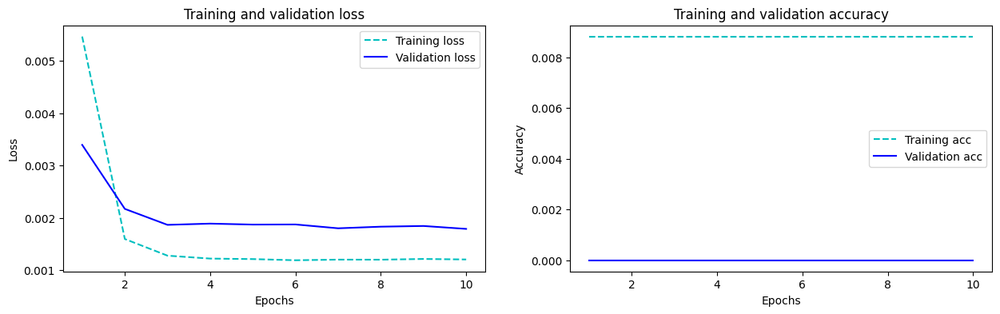

In [59]:
plot_curve(hist_0005)

In [60]:
predict_scaled_0005 = model_0005.predict(X_test)
predict_0005 = sc.inverse_transform(predict_scaled_0005)
test2['LSTM_0005'] = predict_0005
test2

10/10 [==============================] - 1s 5ms/step


,DateTime,cloud_cover,LSTM_01,LSTM_005,LSTM_001,LSTM_0005
0,2021-12-16 09:10:00,0.111,0.350672,0.299703,0.329454,0.324833
1,2021-12-16 09:11:00,0.112,0.149905,0.071950,0.113542,0.124630
2,2021-12-16 09:12:00,0.116,0.132520,0.115974,0.093445,0.113176
3,2021-12-16 09:13:00,0.112,0.137240,0.115293,0.105971,0.115814
4,2021-12-16 09:14:00,0.099,0.137607,0.110649,0.107417,0.112972
...,...,...,...,...,...,...
288,2021-12-16 13:58:00,0.168,0.188434,0.157471,0.163917,0.168234
289,2021-12-16 13:59:00,0.169,0.188446,0.157997,0.163696,0.168131
290,2021-12-16 14:00:00,0.147,0.189143,0.159008,0.164721,0.169033
291,2021-12-16 14:01:00,0.145,0.169085,0.135622,0.143030,0.149067


In [61]:
fig = go.Figure()
fig.add_trace(go.Scatter(mode = 'lines', x = cloud_cover['DateTime'], y = cloud_cover['cloud_cover'], name = 'Actual'))
fig.add_trace(go.Scatter(mode = 'lines', x = test2['DateTime'], y = test2['cloud_cover'], name = 'Actual Test'))
fig.add_trace(go.Scatter(mode = 'lines', x = test2['DateTime'], y = test2['LSTM_0005'], name = 'predict'))
fig.update_layout(
    autosize=True,
    height=600,
    title="LSTM Model",
    xaxis_title="Date",
    yaxis_title="Cloud cover",
)


fig.update_layout(
    xaxis=dict(
        rangeselector=dict(
            buttons=list([
                dict(count=1,
                     label="1.zoom",
                     step="hour",
                     stepmode="backward"),
                 dict(count=2,
                     label="2.zoom",
                     step="hour",
                     stepmode="backward"),
                dict(count=3,
                     label="3.zoom",
                     step="day",
                     stepmode="backward"),              

                dict(step="all")
            ])
        ),
        rangeslider=dict(
            visible=True
        ),
        type="date"
    )
)

fig.show()

In [62]:
lstm_mse_error_unit_50_0005 = mean_squared_error(test2['cloud_cover'], test2['LSTM_0005'], squared=True)
compare_mse_model(lstm_mse_error_unit_50_adam,lstm_mse_error_unit_50_0005)

Better MSE value is :  0.001779986900636294


,Model,MSE error
0,model,0.001807
1,model_1,0.001780


In [70]:
mse_data.loc[len(mse_data)] = ['Lstm mse error adam 50 learning rate 0.005', lstm_mse_error_unit_50_0005]

----------------------------------------------------------------------------------

### lr 0.001

#### Add frist layer: units = 50

In [63]:
model_0001 = Sequential()
model_0001.add(LSTM(units = 50, return_sequences = False, input_shape = (X_train.shape[1], 1)))
model_0001.add(Dense(units = 1))
opt = optimizers.Adam(learning_rate=0.001)
model_0001.compile(optimizer = opt, loss = 'mean_squared_error')
hist_0001 = model_0001.fit(X_train, y_train, validation_data=(X_test, y_test), epochs = 10, batch_size = 32)

Epoch 1/10
461/461 [==============================] - 9s 11ms/step - loss: 0.0083 - accuracy: 0.0087 - val_loss: 0.0054 - val_accuracy: 0.0000e+00
Epoch 2/10
461/461 [==============================] - 4s 9ms/step - loss: 0.0025 - accuracy: 0.0088 - val_loss: 0.0039 - val_accuracy: 0.0000e+00
Epoch 3/10
461/461 [==============================] - 4s 9ms/step - loss: 0.0020 - accuracy: 0.0088 - val_loss: 0.0032 - val_accuracy: 0.0000e+00
Epoch 4/10
461/461 [==============================] - 4s 9ms/step - loss: 0.0017 - accuracy: 0.0088 - val_loss: 0.0027 - val_accuracy: 0.0000e+00
Epoch 5/10
461/461 [==============================] - 4s 9ms/step - loss: 0.0015 - accuracy: 0.0088 - val_loss: 0.0023 - val_accuracy: 0.0000e+00
Epoch 6/10
461/461 [==============================] - 4s 9ms/step - loss: 0.0014 - accuracy: 0.0088 - val_loss: 0.0021 - val_accuracy: 0.0000e+00
Epoch 7/10
461/461 [==============================] - 4s 10ms/step - loss: 0.0013 - accuracy: 0.0088 - val_loss: 0.0019 - v

Last train loss: 0.0011877014767378569
Last validation loss: 0.001848379266448319
Last train accuracy: 0.008817744441330433
Last validation accuracy: 0.0


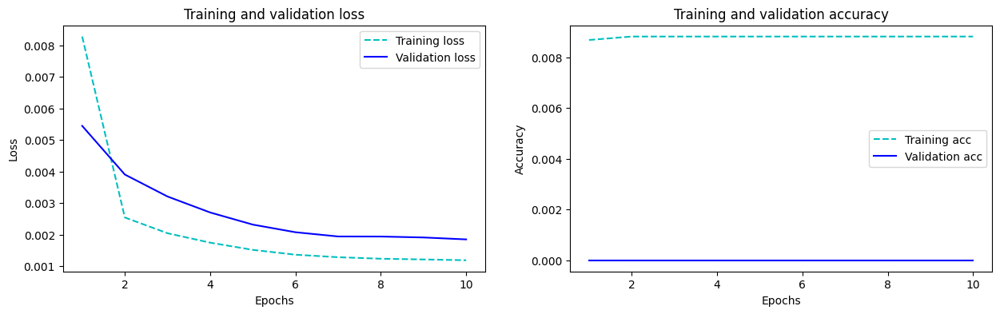

In [64]:
plot_curve(hist_0001)

In [65]:
predict_scaled_0001 = model_001.predict(X_test)
predict_0001 = sc.inverse_transform(predict_scaled_0001)
test2['LSTM_0001'] = predict_0001
test2

10/10 [==============================] - 0s 5ms/step


,DateTime,cloud_cover,LSTM_01,LSTM_005,LSTM_001,LSTM_0005,LSTM_0001
0,2021-12-16 09:10:00,0.111,0.350672,0.299703,0.329454,0.324833,0.329454
1,2021-12-16 09:11:00,0.112,0.149905,0.071950,0.113542,0.124630,0.113542
2,2021-12-16 09:12:00,0.116,0.132520,0.115974,0.093445,0.113176,0.093445
3,2021-12-16 09:13:00,0.112,0.137240,0.115293,0.105971,0.115814,0.105971
4,2021-12-16 09:14:00,0.099,0.137607,0.110649,0.107417,0.112972,0.107417
...,...,...,...,...,...,...,...
288,2021-12-16 13:58:00,0.168,0.188434,0.157471,0.163917,0.168234,0.163917
289,2021-12-16 13:59:00,0.169,0.188446,0.157997,0.163696,0.168131,0.163696
290,2021-12-16 14:00:00,0.147,0.189143,0.159008,0.164721,0.169033,0.164721
291,2021-12-16 14:01:00,0.145,0.169085,0.135622,0.143030,0.149067,0.143030


In [66]:
fig = go.Figure()
fig.add_trace(go.Scatter(mode = 'lines', x = cloud_cover['DateTime'], y = cloud_cover['cloud_cover'], name = 'Actual'))
fig.add_trace(go.Scatter(mode = 'lines', x = test2['DateTime'], y = test2['cloud_cover'], name = 'Actual Test'))
fig.add_trace(go.Scatter(mode = 'lines', x = test2['DateTime'], y = test2['LSTM_0001'], name = 'predict'))
fig.update_layout(
    autosize=True,
    height=600,
    title="LSTM Model",
    xaxis_title="Date",
    yaxis_title="Cloud cover",
)


fig.update_layout(
    xaxis=dict(
        rangeselector=dict(
            buttons=list([
                dict(count=1,
                     label="1.zoom",
                     step="hour",
                     stepmode="backward"),
                 dict(count=2,
                     label="2.zoom",
                     step="hour",
                     stepmode="backward"),
                dict(count=3,
                     label="3.zoom",
                     step="day",
                     stepmode="backward"),              

                dict(step="all")
            ])
        ),
        rangeslider=dict(
            visible=True
        ),
        type="date"
    )
)

fig.show()

In [71]:
lstm_mse_error_0001 = mean_squared_error(test2['cloud_cover'], test2['LSTM_0001'], squared=True)
compare_mse_model(lstm_mse_error_unit_50_0005,lstm_mse_error_0001)

Better MSE value is :  0.001779986900636294


,Model,MSE error
0,model,0.001780
1,model_1,0.001886


In [72]:
mse_data.loc[len(mse_data)] = ['Lstm mse error adam 50 learning rate 0.001', lstm_mse_error_0001]

----------------------------------------------------------------------------------

## Optimizer adam

### Add frist layer: units = 100

In [73]:
test3 = test.copy()

In [74]:
test3['LSTM_50'] = predict_0005
test3

,DateTime,cloud_cover,LSTM_50
0,2021-12-16 09:10:00,0.111,0.324833
1,2021-12-16 09:11:00,0.112,0.124630
2,2021-12-16 09:12:00,0.116,0.113176
3,2021-12-16 09:13:00,0.112,0.115814
4,2021-12-16 09:14:00,0.099,0.112972
...,...,...,...
288,2021-12-16 13:58:00,0.168,0.168234
289,2021-12-16 13:59:00,0.169,0.168131
290,2021-12-16 14:00:00,0.147,0.169033
291,2021-12-16 14:01:00,0.145,0.149067


In [75]:
model_1 = Sequential()
model_1.add(LSTM(units = 100, return_sequences = False, input_shape = (X_train.shape[1], 1)))
model_1.add(Dense(units = 1))
opt = optimizers.Adam(learning_rate=0.005)
model_1.compile(optimizer = opt, loss = 'mean_squared_error')
hist_1 = model_1.fit(X_train, y_train, validation_data=(X_test, y_test), epochs = 10, batch_size = 32)

Epoch 1/10
461/461 [==============================] - 12s 17ms/step - loss: 0.0042 - accuracy: 0.0087 - val_loss: 0.0030 - val_accuracy: 0.0000e+00
Epoch 2/10
461/461 [==============================] - 7s 15ms/step - loss: 0.0015 - accuracy: 0.0088 - val_loss: 0.0021 - val_accuracy: 0.0000e+00
Epoch 3/10
461/461 [==============================] - 7s 14ms/step - loss: 0.0013 - accuracy: 0.0088 - val_loss: 0.0019 - val_accuracy: 0.0000e+00
Epoch 4/10
461/461 [==============================] - 7s 15ms/step - loss: 0.0012 - accuracy: 0.0088 - val_loss: 0.0019 - val_accuracy: 0.0000e+00
Epoch 5/10
461/461 [==============================] - 7s 15ms/step - loss: 0.0012 - accuracy: 0.0088 - val_loss: 0.0018 - val_accuracy: 0.0000e+00
Epoch 6/10
461/461 [==============================] - 7s 15ms/step - loss: 0.0012 - accuracy: 0.0088 - val_loss: 0.0019 - val_accuracy: 0.0000e+00
Epoch 7/10
461/461 [==============================] - 7s 16ms/step - loss: 0.0012 - accuracy: 0.0088 - val_loss: 0.00

Last train loss: 0.0012281440431252122
Last validation loss: 0.001826956169679761
Last train accuracy: 0.008817744441330433
Last validation accuracy: 0.0


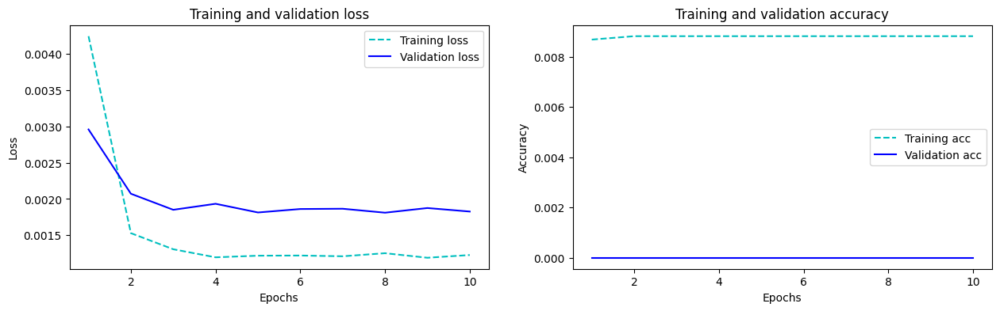

In [76]:
plot_curve(hist_1)

In [77]:
predict_scaled_1 = model_1.predict(X_test)
predict_1 = sc.inverse_transform(predict_scaled_1)
test3['LSTM_100'] = predict_1
test3

10/10 [==============================] - 1s 5ms/step


,DateTime,cloud_cover,LSTM_50,LSTM_100
0,2021-12-16 09:10:00,0.111,0.324833,0.323501
1,2021-12-16 09:11:00,0.112,0.124630,0.122716
2,2021-12-16 09:12:00,0.116,0.113176,0.115233
3,2021-12-16 09:13:00,0.112,0.115814,0.113749
4,2021-12-16 09:14:00,0.099,0.112972,0.109307
...,...,...,...,...
288,2021-12-16 13:58:00,0.168,0.168234,0.165615
289,2021-12-16 13:59:00,0.169,0.168131,0.165630
290,2021-12-16 14:00:00,0.147,0.169033,0.166516
291,2021-12-16 14:01:00,0.145,0.149067,0.145661


In [78]:
fig = go.Figure()
fig.add_trace(go.Scatter(mode = 'lines', x = cloud_cover['DateTime'], y = cloud_cover['cloud_cover'], name = 'Actual'))
fig.add_trace(go.Scatter(mode = 'lines', x = test3['DateTime'], y = test3['cloud_cover'], name = 'Actual Test'))
fig.add_trace(go.Scatter(mode = 'lines', x = test3['DateTime'], y = test3['LSTM_100'], name = 'predict'))
fig.update_layout(
    autosize=True,
    height=600,
    title="LSTM Model",
    xaxis_title="Date",
    yaxis_title="Cloud cover",
)


fig.update_layout(
    xaxis=dict(
        rangeselector=dict(
            buttons=list([
                dict(count=1,
                     label="1.zoom",
                     step="hour",
                     stepmode="backward"),
                 dict(count=2,
                     label="2.zoom",
                     step="hour",
                     stepmode="backward"),
                dict(count=3,
                     label="3.zoom",
                     step="day",
                     stepmode="backward"),              

                dict(step="all")
            ])
        ),
        rangeslider=dict(
            visible=True
        ),
        type="date"
    )
)

fig.show()

In [79]:
lstm_mse_error_unit_100 = mean_squared_error(test3['cloud_cover'], test3['LSTM_100'], squared=True)
compare_mse_model(lstm_mse_error_unit_50_0005,lstm_mse_error_unit_100)

Better MSE value is :  0.001779986900636294


,Model,MSE error
0,model,0.001780
1,model_1,0.001818


In [80]:
mse_data.loc[len(mse_data)] = ['Lstm mse error adam frist layer unit 100 learning rate 0.005', lstm_mse_error_unit_100]

------------

### Add frist layer: units = 50 and Add Dropout = 0.1

In [81]:
model_2 = Sequential()
model_2.add(LSTM(units = 50, return_sequences = False, input_shape = (X_train.shape[1], 1)))
model_2.add(Dropout(0.1))
model_2.add(Dense(units = 1))
opt = optimizers.Adam(learning_rate=0.005)
model_2.compile(optimizer = opt, loss = 'mean_squared_error')
hist_2 = model_2.fit(X_train, y_train, validation_data=(X_test, y_test), epochs = 10, batch_size = 32)

Epoch 1/10
461/461 [==============================] - 9s 13ms/step - loss: 0.0054 - accuracy: 0.0088 - val_loss: 0.0033 - val_accuracy: 0.0000e+00
Epoch 2/10
461/461 [==============================] - 6s 14ms/step - loss: 0.0024 - accuracy: 0.0088 - val_loss: 0.0022 - val_accuracy: 0.0000e+00
Epoch 3/10
461/461 [==============================] - 5s 11ms/step - loss: 0.0019 - accuracy: 0.0088 - val_loss: 0.0019 - val_accuracy: 0.0000e+00
Epoch 4/10
461/461 [==============================] - 5s 11ms/step - loss: 0.0017 - accuracy: 0.0088 - val_loss: 0.0019 - val_accuracy: 0.0000e+00
Epoch 5/10
461/461 [==============================] - 5s 11ms/step - loss: 0.0017 - accuracy: 0.0088 - val_loss: 0.0020 - val_accuracy: 0.0000e+00
Epoch 6/10
461/461 [==============================] - 5s 11ms/step - loss: 0.0016 - accuracy: 0.0088 - val_loss: 0.0018 - val_accuracy: 0.0000e+00
Epoch 7/10
461/461 [==============================] - 5s 12ms/step - loss: 0.0016 - accuracy: 0.0088 - val_loss: 0.001

Last train loss: 0.0015370614128187299
Last validation loss: 0.0018455353565514088
Last train accuracy: 0.008817744441330433
Last validation accuracy: 0.0


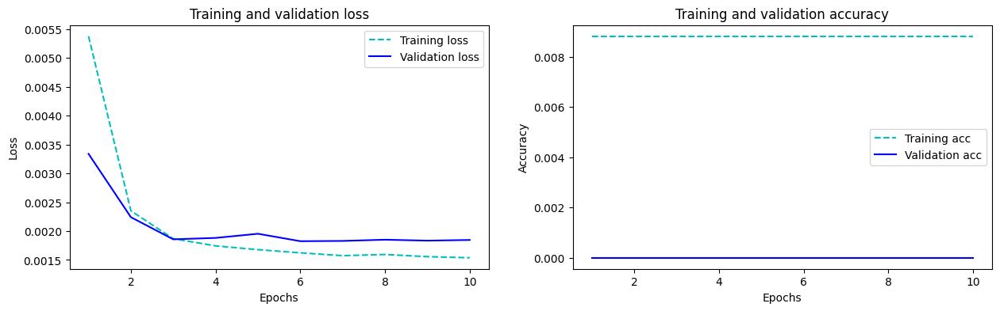

In [82]:
plot_curve(hist_2)

In [83]:
predict_scaled_2 = model_2.predict(X_test)
predict_2 = sc.inverse_transform(predict_scaled_2)
test3['LSTM_Drop_out'] = predict_2
test3

10/10 [==============================] - 1s 5ms/step


,DateTime,cloud_cover,LSTM_50,LSTM_100,LSTM_Drop_out
0,2021-12-16 09:10:00,0.111,0.324833,0.323501,0.318145
1,2021-12-16 09:11:00,0.112,0.124630,0.122716,0.124993
2,2021-12-16 09:12:00,0.116,0.113176,0.115233,0.108322
3,2021-12-16 09:13:00,0.112,0.115814,0.113749,0.108663
4,2021-12-16 09:14:00,0.099,0.112972,0.109307,0.105823
...,...,...,...,...,...
288,2021-12-16 13:58:00,0.168,0.168234,0.165615,0.162439
289,2021-12-16 13:59:00,0.169,0.168131,0.165630,0.162373
290,2021-12-16 14:00:00,0.147,0.169033,0.166516,0.163245
291,2021-12-16 14:01:00,0.145,0.149067,0.145661,0.143357


In [84]:
fig = go.Figure()
fig.add_trace(go.Scatter(mode = 'lines', x = cloud_cover['DateTime'], y = cloud_cover['cloud_cover'], name = 'Actual'))
fig.add_trace(go.Scatter(mode = 'lines', x = test3['DateTime'], y = test3['cloud_cover'], name = 'Actual Test'))
fig.add_trace(go.Scatter(mode = 'lines', x = test3['DateTime'], y = test3['LSTM_Drop_out'], name = 'predict'))
fig.update_layout(
    autosize=True,
    height=600,
    title="LSTM Model",
    xaxis_title="Date",
    yaxis_title="Cloud cover",
)


fig.update_layout(
    xaxis=dict(
        rangeselector=dict(
            buttons=list([
                dict(count=1,
                     label="1.zoom",
                     step="hour",
                     stepmode="backward"),
                 dict(count=2,
                     label="2.zoom",
                     step="hour",
                     stepmode="backward"),
                dict(count=3,
                     label="3.zoom",
                     step="day",
                     stepmode="backward"),              

                dict(step="all")
            ])
        ),
        rangeslider=dict(
            visible=True
        ),
        type="date"
    )
)

fig.show()

In [85]:
lstm_mse_error_50_drop_out = mean_squared_error(test3['cloud_cover'], test3['LSTM_Drop_out'], squared=True)
compare_mse_model(lstm_mse_error_unit_50_0005,lstm_mse_error_50_drop_out)

Better MSE value is :  0.001779986900636294


,Model,MSE error
0,model,0.001780
1,model_1,0.001836


In [86]:
mse_data.loc[len(mse_data)] = ['Lstm mse error adam 50 drop out 0.1 learning rate 0.005', lstm_mse_error_50_drop_out]

------------------------------------

### Add frist layer: units = 50 and Add second layer: unit = 50

In [87]:
model_3 = Sequential()
model_3.add(LSTM(units = 50, return_sequences = True, input_shape = (X_train.shape[1], 1)))
model_3.add(LSTM(units = 50))
model_3.add(Dense(units = 1))
opt = optimizers.Adam(learning_rate=0.005)
model_3.compile(optimizer = opt, loss = 'mean_squared_error')
hist_3 = model_3.fit(X_train, y_train, validation_data=(X_test, y_test),  epochs = 10, batch_size = 32)

Epoch 1/10
461/461 [==============================] - 20s 30ms/step - loss: 0.0045 - accuracy: 0.0087 - val_loss: 0.0023 - val_accuracy: 0.0000e+00
Epoch 2/10
461/461 [==============================] - 10s 22ms/step - loss: 0.0014 - accuracy: 0.0088 - val_loss: 0.0020 - val_accuracy: 0.0000e+00
Epoch 3/10
461/461 [==============================] - 9s 20ms/step - loss: 0.0013 - accuracy: 0.0088 - val_loss: 0.0018 - val_accuracy: 0.0000e+00
Epoch 4/10
461/461 [==============================] - 9s 20ms/step - loss: 0.0013 - accuracy: 0.0088 - val_loss: 0.0019 - val_accuracy: 0.0000e+00
Epoch 5/10
461/461 [==============================] - 9s 20ms/step - loss: 0.0013 - accuracy: 0.0088 - val_loss: 0.0018 - val_accuracy: 0.0000e+00
Epoch 6/10
461/461 [==============================] - 11s 23ms/step - loss: 0.0013 - accuracy: 0.0088 - val_loss: 0.0018 - val_accuracy: 0.0000e+00
Epoch 7/10
461/461 [==============================] - 12s 26ms/step - loss: 0.0013 - accuracy: 0.0088 - val_loss: 0

Last train loss: 0.001285920268855989
Last validation loss: 0.0018869423074647784
Last train accuracy: 0.008817744441330433
Last validation accuracy: 0.0


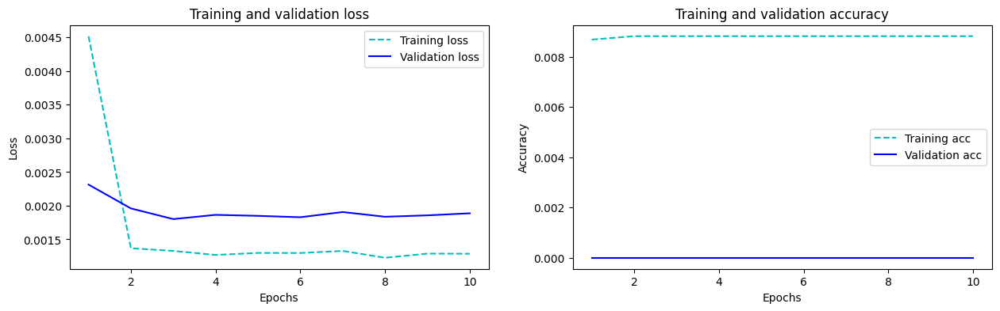

In [88]:
plot_curve(hist_3)

In [89]:
predict_scaled_3 = model_3.predict(X_test)
predict_3 = sc.inverse_transform(predict_scaled_3)
test3['LSTM_second_layer_50'] = predict_3
test3

10/10 [==============================] - 3s 8ms/step


,DateTime,cloud_cover,LSTM_50,LSTM_100,LSTM_Drop_out,LSTM_second_layer_50
0,2021-12-16 09:10:00,0.111,0.324833,0.323501,0.318145,0.334109
1,2021-12-16 09:11:00,0.112,0.124630,0.122716,0.124993,0.136222
2,2021-12-16 09:12:00,0.116,0.113176,0.115233,0.108322,0.119746
3,2021-12-16 09:13:00,0.112,0.115814,0.113749,0.108663,0.124230
4,2021-12-16 09:14:00,0.099,0.112972,0.109307,0.105823,0.122826
...,...,...,...,...,...,...
288,2021-12-16 13:58:00,0.168,0.168234,0.165615,0.162439,0.175258
289,2021-12-16 13:59:00,0.169,0.168131,0.165630,0.162373,0.175092
290,2021-12-16 14:00:00,0.147,0.169033,0.166516,0.163245,0.175971
291,2021-12-16 14:01:00,0.145,0.149067,0.145661,0.143357,0.156165


In [90]:
fig = go.Figure()
fig.add_trace(go.Scatter(mode = 'lines', x = cloud_cover['DateTime'], y = cloud_cover['cloud_cover'], name = 'Actual'))
fig.add_trace(go.Scatter(mode = 'lines', x = test3['DateTime'], y = test3['cloud_cover'], name = 'Actual Test'))
fig.add_trace(go.Scatter(mode = 'lines', x = test3['DateTime'], y = test3['LSTM_second_layer_50'], name = 'predict'))
fig.update_layout(
    autosize=True,
    height=600,
    title="LSTM Model",
    xaxis_title="Date",
    yaxis_title="Cloud cover",
)


fig.update_layout(
    xaxis=dict(
        rangeselector=dict(
            buttons=list([
                dict(count=1,
                     label="1.zoom",
                     step="hour",
                     stepmode="backward"),
                 dict(count=2,
                     label="2.zoom",
                     step="hour",
                     stepmode="backward"),
                dict(count=3,
                     label="3.zoom",
                     step="day",
                     stepmode="backward"),              

                dict(step="all")
            ])
        ),
        rangeslider=dict(
            visible=True
        ),
        type="date"
    )
)

fig.show()

In [91]:
lstm_mse_error_second_layer = mean_squared_error(test3['cloud_cover'], test3['LSTM_second_layer_50'], squared=True)
compare_mse_model(lstm_mse_error_unit_50_0005,lstm_mse_error_second_layer)

Better MSE value is :  0.001779986900636294


,Model,MSE error
0,model,0.001780
1,model_1,0.001878


In [92]:
mse_data.loc[len(mse_data)] = ['Lstm mse error adam 50 second layer unit 50 learning rate 0.005 ', lstm_mse_error_second_layer]

---

### Add frist layer: units = 50 and Add second layer: unit = 100

In [93]:
model_4 = Sequential()
model_4.add(LSTM(units = 50, return_sequences = True, input_shape = (X_train.shape[1], 1)))
model_4.add(LSTM(units = 100))
model_4.add(Dense(units = 1))
opt = optimizers.Adam(learning_rate=0.005)
model_4.compile(optimizer = opt, loss = 'mean_squared_error')
hist_4 = model_4.fit(X_train, y_train, validation_data=(X_test, y_test),  epochs = 10, batch_size = 32)

Epoch 1/10
461/461 [==============================] - 23s 37ms/step - loss: 0.0058 - accuracy: 0.0087 - val_loss: 0.0030 - val_accuracy: 0.0000e+00
Epoch 2/10
461/461 [==============================] - 20s 43ms/step - loss: 0.0015 - accuracy: 0.0088 - val_loss: 0.0020 - val_accuracy: 0.0000e+00
Epoch 3/10
461/461 [==============================] - 14s 30ms/step - loss: 0.0013 - accuracy: 0.0088 - val_loss: 0.0019 - val_accuracy: 0.0000e+00
Epoch 4/10
461/461 [==============================] - 22s 47ms/step - loss: 0.0013 - accuracy: 0.0088 - val_loss: 0.0019 - val_accuracy: 0.0000e+00
Epoch 5/10
461/461 [==============================] - 13s 27ms/step - loss: 0.0013 - accuracy: 0.0088 - val_loss: 0.0024 - val_accuracy: 0.0000e+00
Epoch 6/10
461/461 [==============================] - 13s 28ms/step - loss: 0.0013 - accuracy: 0.0088 - val_loss: 0.0018 - val_accuracy: 0.0000e+00
Epoch 7/10
461/461 [==============================] - 13s 27ms/step - loss: 0.0013 - accuracy: 0.0088 - val_loss

Last train loss: 0.001247861422598362
Last validation loss: 0.0019905329681932926
Last train accuracy: 0.008817744441330433
Last validation accuracy: 0.0


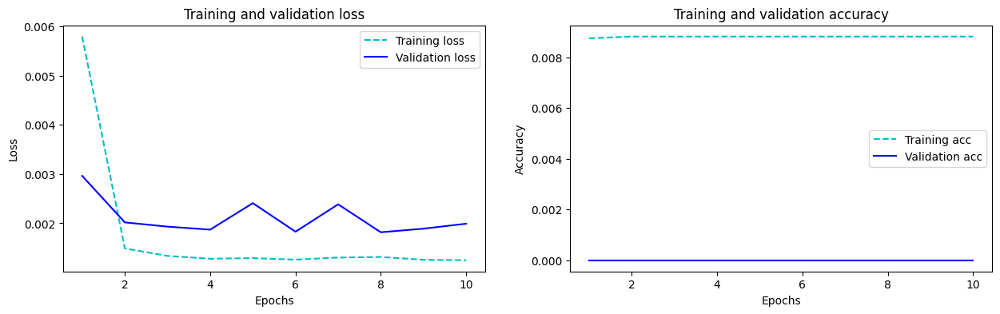

In [94]:
plot_curve(hist_4)

In [95]:
predict_scaled_4 = model_4.predict(X_test)
predict_4 = sc.inverse_transform(predict_scaled_4)
test3['LSTM_second_layer_100'] = predict_4
test3

10/10 [==============================] - 2s 12ms/step


,DateTime,cloud_cover,LSTM_50,LSTM_100,LSTM_Drop_out,LSTM_second_layer_50,LSTM_second_layer_100
0,2021-12-16 09:10:00,0.111,0.324833,0.323501,0.318145,0.334109,0.320810
1,2021-12-16 09:11:00,0.112,0.124630,0.122716,0.124993,0.136222,0.131146
2,2021-12-16 09:12:00,0.116,0.113176,0.115233,0.108322,0.119746,0.100974
3,2021-12-16 09:13:00,0.112,0.115814,0.113749,0.108663,0.124230,0.104480
4,2021-12-16 09:14:00,0.099,0.112972,0.109307,0.105823,0.122826,0.103817
...,...,...,...,...,...,...,...
288,2021-12-16 13:58:00,0.168,0.168234,0.165615,0.162439,0.175258,0.157601
289,2021-12-16 13:59:00,0.169,0.168131,0.165630,0.162373,0.175092,0.157289
290,2021-12-16 14:00:00,0.147,0.169033,0.166516,0.163245,0.175971,0.158119
291,2021-12-16 14:01:00,0.145,0.149067,0.145661,0.143357,0.156165,0.139499


In [96]:
fig = go.Figure()
fig.add_trace(go.Scatter(mode = 'lines', x = cloud_cover['DateTime'], y = cloud_cover['cloud_cover'], name = 'Actual'))
fig.add_trace(go.Scatter(mode = 'lines', x = test3['DateTime'], y = test3['cloud_cover'], name = 'Actual Test'))
fig.add_trace(go.Scatter(mode = 'lines', x = test3['DateTime'], y = test3['LSTM_second_layer_100'], name = 'predict'))
fig.update_layout(
    autosize=True,
    height=600,
    title="LSTM Model",
    xaxis_title="Date",
    yaxis_title="Cloud cover",
)


fig.update_layout(
    xaxis=dict(
        rangeselector=dict(
            buttons=list([
                dict(count=1,
                     label="1.zoom",
                     step="hour",
                     stepmode="backward"),
                 dict(count=2,
                     label="2.zoom",
                     step="hour",
                     stepmode="backward"),
                dict(count=3,
                     label="3.zoom",
                     step="day",
                     stepmode="backward"),              

                dict(step="all")
            ])
        ),
        rangeslider=dict(
            visible=True
        ),
        type="date"
    )
)

fig.show()

In [97]:
lstm_mse_error_second_layer_unit100 = mean_squared_error(test3['cloud_cover'], test3['LSTM_second_layer_100'], squared=True)
compare_mse_model(lstm_mse_error_unit_50_0005,lstm_mse_error_second_layer_unit100)

Better MSE value is :  0.001779986900636294


,Model,MSE error
0,model,0.001780
1,model_1,0.001981


In [98]:
mse_data.loc[len(mse_data)] = ['Lstm mse error adam 50 second layer unit 100 learning rate 0.005', lstm_mse_error_second_layer_unit100]
mse_data

,Model,LSTM lag25
0,Lstm mse error unit 50 adam,0.001807
1,Lstm mse error unit 50 sgd,0.004923
2,Lstm mse error unit 50 rmsprop,0.001845
3,Lstm mse error adam 50 batch_size64,0.001964
4,Lstm mse error adam 50 learning rate 0.1,0.002321
5,Lstm mse error adam 50 learning rate 0.05,0.001954
6,Lstm mse error adam 50 learning rate 0.01,0.001886
7,Lstm mse error adam 50 learning rate 0.005,0.001780
8,Lstm mse error adam 50 learning rate 0.001,0.001886
9,Lstm mse error adam frist layer unit 100 learn...,0.001818


---

### Add frist layer: units = 50 and change epochs from 10 to 30

In [99]:
model_5 = Sequential()
model_5.add(LSTM(units = 50, return_sequences = False, input_shape = (X_train.shape[1], 1)))
model_5.add(Dense(units = 1))
opt = optimizers.Adam(learning_rate=0.005)
model_5.compile(optimizer = opt, loss = 'mean_squared_error')
hist_5 = model_5.fit(X_train, y_train, validation_data=(X_test, y_test), epochs = 30, batch_size = 32)

Epoch 1/30
461/461 [==============================] - 11s 16ms/step - loss: 0.0046 - accuracy: 0.0087 - val_loss: 0.0034 - val_accuracy: 0.0000e+00
Epoch 2/30
461/461 [==============================] - 7s 14ms/step - loss: 0.0016 - accuracy: 0.0088 - val_loss: 0.0023 - val_accuracy: 0.0000e+00
Epoch 3/30
461/461 [==============================] - 6s 14ms/step - loss: 0.0013 - accuracy: 0.0088 - val_loss: 0.0021 - val_accuracy: 0.0000e+00
Epoch 4/30
461/461 [==============================] - 5s 11ms/step - loss: 0.0013 - accuracy: 0.0088 - val_loss: 0.0018 - val_accuracy: 0.0000e+00
Epoch 5/30
461/461 [==============================] - 5s 10ms/step - loss: 0.0012 - accuracy: 0.0088 - val_loss: 0.0019 - val_accuracy: 0.0000e+00
Epoch 6/30
461/461 [==============================] - 6s 14ms/step - loss: 0.0012 - accuracy: 0.0088 - val_loss: 0.0019 - val_accuracy: 0.0000e+00
Epoch 7/30
461/461 [==============================] - 5s 11ms/step - loss: 0.0012 - accuracy: 0.0088 - val_loss: 0.00

Last train loss: 0.0011940447147935629
Last validation loss: 0.001867602695710957
Last train accuracy: 0.008817744441330433
Last validation accuracy: 0.0


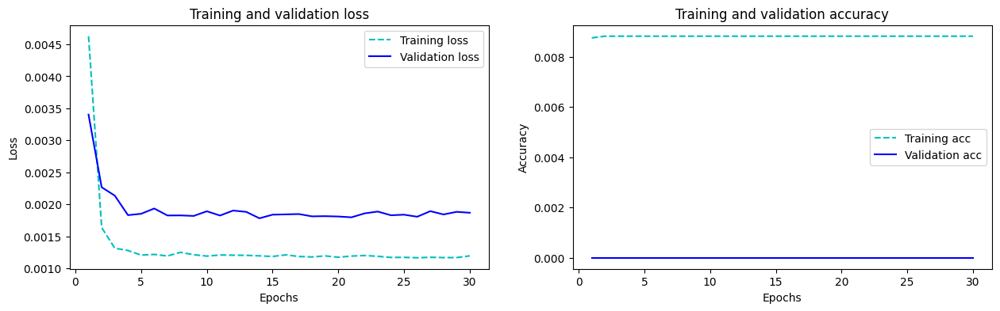

In [100]:
plot_curve(hist_5)

In [101]:
predict_scaled_5 = model_5.predict(X_test)
predict_5 = sc.inverse_transform(predict_scaled_5)
test3['LSTM_epoch30'] = predict_5
test3

10/10 [==============================] - 1s 5ms/step


,DateTime,cloud_cover,LSTM_50,LSTM_100,LSTM_Drop_out,LSTM_second_layer_50,LSTM_second_layer_100,LSTM_epoch30
0,2021-12-16 09:10:00,0.111,0.324833,0.323501,0.318145,0.334109,0.320810,0.329740
1,2021-12-16 09:11:00,0.112,0.124630,0.122716,0.124993,0.136222,0.131146,0.127178
2,2021-12-16 09:12:00,0.116,0.113176,0.115233,0.108322,0.119746,0.100974,0.129008
3,2021-12-16 09:13:00,0.112,0.115814,0.113749,0.108663,0.124230,0.104480,0.132613
4,2021-12-16 09:14:00,0.099,0.112972,0.109307,0.105823,0.122826,0.103817,0.126778
...,...,...,...,...,...,...,...,...
288,2021-12-16 13:58:00,0.168,0.168234,0.165615,0.162439,0.175258,0.157601,0.176798
289,2021-12-16 13:59:00,0.169,0.168131,0.165630,0.162373,0.175092,0.157289,0.176858
290,2021-12-16 14:00:00,0.147,0.169033,0.166516,0.163245,0.175971,0.158119,0.177763
291,2021-12-16 14:01:00,0.145,0.149067,0.145661,0.143357,0.156165,0.139499,0.156855


In [102]:
fig = go.Figure()
fig.add_trace(go.Scatter(mode = 'lines', x = cloud_cover['DateTime'], y = cloud_cover['cloud_cover'], name = 'Actual'))
fig.add_trace(go.Scatter(mode = 'lines', x = test3['DateTime'], y = test3['cloud_cover'], name = 'Actual Test'))
fig.add_trace(go.Scatter(mode = 'lines', x = test3['DateTime'], y = test3['LSTM_epoch30'], name = 'predict'))
fig.update_layout(
    autosize=True,
    height=600,
    title="LSTM Model",
    xaxis_title="Date",
    yaxis_title="Cloud cover",
)


fig.update_layout(
    xaxis=dict(
        rangeselector=dict(
            buttons=list([
                dict(count=1,
                     label="1.zoom",
                     step="hour",
                     stepmode="backward"),
                 dict(count=2,
                     label="2.zoom",
                     step="hour",
                     stepmode="backward"),
                dict(count=3,
                     label="3.zoom",
                     step="day",
                     stepmode="backward"),              

                dict(step="all")
            ])
        ),
        rangeslider=dict(
            visible=True
        ),
        type="date"
    )
)

fig.show()

In [103]:
lstm_mse_error_unit_50_epoch30 = mean_squared_error(test3['cloud_cover'], test3['LSTM_epoch30'], squared=True)
compare_mse_model(lstm_mse_error_unit_50_0005,lstm_mse_error_unit_50_epoch30)

Better MSE value is :  0.001779986900636294


,Model,MSE error
0,model,0.001780
1,model_1,0.001858


---

In [104]:
mse_data.loc[len(mse_data)] = ['Lstm mse error adam 50 epoch 30 learning rate 0.005', lstm_mse_error_unit_50_epoch30]

In [137]:
mse_data1 = mse_data.replace({'Model' : { 'Lstm mse error adam 50 second layer unit 50 learning rate 0.005 ':'Lstm mse error adam 50 second layer unit 50 learning rate 0.005'}})
mse_data1

,Model,LSTM lag25
0,Lstm mse error unit 50 adam,0.001807
1,Lstm mse error unit 50 sgd,0.004923
2,Lstm mse error unit 50 rmsprop,0.001845
3,Lstm mse error adam 50 batch_size64,0.001964
4,Lstm mse error adam 50 learning rate 0.1,0.002321
5,Lstm mse error adam 50 learning rate 0.05,0.001954
6,Lstm mse error adam 50 learning rate 0.01,0.001886
7,Lstm mse error adam 50 learning rate 0.005,0.001780
8,Lstm mse error adam 50 learning rate 0.001,0.001886
9,Lstm mse error adam frist layer unit 100 learn...,0.001818


In [138]:
minimum_mse= mse_data1.loc[mse_data['LSTM lag25'].idxmin()]
minimum_mse

Model         Lstm mse error adam 50 learning rate 0.005
LSTM lag25                                       0.00178
Name: 7, dtype: object

In [120]:
data_mse = pd.read_csv('data_lstm_mse.csv')
data_mse

,Model,LSTM lag1,LSTM lag5,LSTM lag10,LSTM lag15,LSTM lag20,LSTM lag25
0,Lstm mse error unit 50 adam,0.001787,0.001836,0.001867,0.001858,0.001823,0.001807
1,Lstm mse error unit 50 sgd,0.001811,0.003412,0.005053,0.004738,0.005080,0.004923
2,Lstm mse error unit 50 rmsprop,0.001818,0.001846,0.001882,0.001867,0.001825,0.001845
3,Lstm mse error adam 50 batch_size64,0.001813,0.002645,0.002490,0.002184,0.001861,0.001964
4,Lstm mse error adam 50 learning rate 0.1,0.002110,0.002288,0.010058,0.002401,0.001952,0.002321
5,Lstm mse error adam 50 learning rate 0.05,0.002076,0.002237,0.001830,0.003924,0.001887,0.001954
6,Lstm mse error adam 50 learning rate 0.01,0.001828,0.001973,0.002654,0.001864,0.002085,0.001886
7,Lstm mse error adam 50 learning rate 0.005,0.001792,0.001838,0.001841,0.001923,0.001812,0.001780
8,Lstm mse error adam 50 learning rate 0.001,0.001828,0.001973,0.002654,0.001864,0.002085,0.001886
9,Lstm mse error adam frist layer unit 100,0.001802,0.001811,NaN,0.001799,NaN,NaN


In [133]:
# data_mse1 = data_mse.drop(index=34)
# data_mse1

,Model,LSTM lag1,LSTM lag5,LSTM lag10,LSTM lag15,LSTM lag20
0,Lstm mse error unit 50 adam,0.001787,0.001836,0.001867,0.001858,0.001823
1,Lstm mse error unit 50 sgd,0.001811,0.003412,0.005053,0.004738,0.005080
2,Lstm mse error unit 50 rmsprop,0.001818,0.001846,0.001882,0.001867,0.001825
3,Lstm mse error adam 50 batch_size64,0.001813,0.002645,0.002490,0.002184,0.001861
4,Lstm mse error adam 50 learning rate 0.1,0.002110,0.002288,0.010058,0.002401,0.001952
5,Lstm mse error adam 50 learning rate 0.05,0.002076,0.002237,0.001830,0.003924,0.001887
6,Lstm mse error adam 50 learning rate 0.01,0.001828,0.001973,0.002654,0.001864,0.002085
7,Lstm mse error adam 50 learning rate 0.005,0.001792,0.001838,0.001841,0.001923,0.001812
8,Lstm mse error adam 50 learning rate 0.001,0.001828,0.001973,0.002654,0.001864,0.002085
9,Lstm mse error adam frist layer unit 100,0.001802,0.001811,NaN,0.001799,NaN


In [139]:
mse = pd.merge(data_mse1,mse_data1, on = 'Model', how='outer')
mse

,Model,LSTM lag1,LSTM lag5,LSTM lag10,LSTM lag15,LSTM lag20,LSTM lag25
0,Lstm mse error unit 50 adam,0.001787,0.001836,0.001867,0.001858,0.001823,0.001807
1,Lstm mse error unit 50 sgd,0.001811,0.003412,0.005053,0.004738,0.005080,0.004923
2,Lstm mse error unit 50 rmsprop,0.001818,0.001846,0.001882,0.001867,0.001825,0.001845
3,Lstm mse error adam 50 batch_size64,0.001813,0.002645,0.002490,0.002184,0.001861,0.001964
4,Lstm mse error adam 50 learning rate 0.1,0.002110,0.002288,0.010058,0.002401,0.001952,0.002321
5,Lstm mse error adam 50 learning rate 0.05,0.002076,0.002237,0.001830,0.003924,0.001887,0.001954
6,Lstm mse error adam 50 learning rate 0.01,0.001828,0.001973,0.002654,0.001864,0.002085,0.001886
7,Lstm mse error adam 50 learning rate 0.005,0.001792,0.001838,0.001841,0.001923,0.001812,0.001780
8,Lstm mse error adam 50 learning rate 0.001,0.001828,0.001973,0.002654,0.001864,0.002085,0.001886
9,Lstm mse error adam frist layer unit 100,0.001802,0.001811,NaN,0.001799,NaN,NaN


In [140]:
# mse["LSTM lag1", "LSTM lag5"] = pd.to_numeric(mse["LSTM lag1", "LSTM lag5"])
minimum_mse1= mse[['LSTM lag1','LSTM lag5','LSTM lag10','LSTM lag15','LSTM lag20','LSTM lag25']].idxmin()
minimum_mse1

LSTM lag1      0
LSTM lag5     17
LSTM lag10     5
LSTM lag15     9
LSTM lag20     7
LSTM lag25     7
dtype: int64

In [146]:
minimum_mse1= mse.loc[mse[['LSTM lag1','LSTM lag5','LSTM lag10','LSTM lag15','LSTM lag20','LSTM lag25']].idxmin()]
minimum_mse1

,Model,LSTM lag1,LSTM lag5,LSTM lag10,LSTM lag15,LSTM lag20,LSTM lag25
0,Lstm mse error unit 50 adam,0.001787,0.001836,0.001867,0.001858,0.001823,0.001807
17,Lstm mse error adam 100 second layer unit 100,NaN,0.001801,NaN,0.001830,NaN,NaN
5,Lstm mse error adam 50 learning rate 0.05,0.002076,0.002237,0.001830,0.003924,0.001887,0.001954
9,Lstm mse error adam frist layer unit 100,0.001802,0.001811,NaN,0.001799,NaN,NaN
7,Lstm mse error adam 50 learning rate 0.005,0.001792,0.001838,0.001841,0.001923,0.001812,0.001780
7,Lstm mse error adam 50 learning rate 0.005,0.001792,0.001838,0.001841,0.001923,0.001812,0.001780


In [148]:
mse.to_csv('data_lstm_mse.csv', index=False)

In [145]:
model_0005.save('model_lag25.h5')